In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!git clone https://github.com/fizyr/keras-retinanet.git

Cloning into 'keras-retinanet'...
remote: Enumerating objects: 81, done.
remote: Counting objects: 100% (81/81), done.
remote: Compressing objects: 100% (59/59), done.
remote: Total 6190 (delta 42), reused 38 (delta 22), pack-reused 6109
Receiving objects: 100% (6190/6190), 14.88 MiB | 34.72 MiB/s, done.
Resolving deltas: 100% (4165/4165), done.


In [3]:
%cd keras-retinanet/
!pip install .
!python setup.py build_ext --inplace

/content/keras-retinanet
Processing /content/keras-retinanet
  Created wheel for keras-retinanet: filename=keras_retinanet-1.0.0-cp36-cp36m-linux_x86_64.whl size=168072 sha256=65c63a0f4b6269414d6072b1313bdbb5eb474436df3a28c027c13b567c60d4b6
  Stored in directory: /root/.cache/pip/wheels/b2/9f/57/cb0305f6f5a41fc3c11ad67b8cedfbe9127775b563337827ba
  Created wheel for keras-resnet: filename=keras_resnet-0.2.0-py2.py3-none-any.whl size=20487 sha256=064aadd32e13e26e4a0ebfd3adca5e4f74c402a12e93d06db96fe37de25ee941
  Stored in directory: /root/.cache/pip/wheels/5f/09/a5/497a30fd9ad9964e98a1254d1e164bcd1b8a5eda36197ecb3c
Successfully built keras-retinanet keras-resnet
running build_ext
cythoning keras_retinanet/utils/compute_overlap.pyx to keras_retinanet/utils/compute_overlap.c
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/keras-retinanet/k

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import requests
import urllib
import os
from PIL import Image
import cv2

from keras_retinanet import models
from keras_retinanet.utils.image import preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

import xml.etree.ElementTree as ET

In [6]:
df_train = pd.DataFrame()
for filename in os.listdir('/content/drive/My Drive/data/'):
    if filename.split('.')[1] == 'xml':
        converted_data_train = {
        'image_name': [],
        'x_min': [],
        'y_min': [],
        'x_max': [],
        'y_max': [],
        'class_name': [],}

        tree = ET.parse("/content/drive/My Drive/data/" +filename)
        root = tree.getroot()
        imname = root.find('filename').text
        converted_data_train['image_name'] ="/content/drive/My Drive/data/" + imname

        for boxes in root.iter('object'):
            ymin, xmin, ymax, xmax = None, None, None, None
            objname = boxes.find("name").text
            converted_data_train['class_name'] = objname
            for box in boxes.findall("bndbox"):
                ymin = int(box.find("ymin").text)
                xmin = int(box.find("xmin").text)
                ymax = int(box.find("ymax").text)
                xmax = int(box.find("xmax").text)
                converted_data_train['x_min'] = int(xmin)
                converted_data_train['y_min'] = int(ymin)
                converted_data_train['x_max'] = int(xmax)
                converted_data_train['y_max'] = int(ymax)
            df_train = df_train.append(converted_data_train, ignore_index=True)
          

        

In [8]:
def show_image_with_boxes(df):
  filepath = df.sample()['image_name'].values[0]


  df2 = df[df['image_name'] == filepath]
  im = np.array(Image.open(filepath))

  im = im[:,:,:3]

  for idx, row in df2.iterrows():
    box = [
      row['x_min'],
      row['y_min'],
      row['x_max'],
      row['y_max'],
    ]
    print(box)
    draw_box(im, box, color=(0, 255, 0))

  plt.axis('off')
  plt.imshow(im)
  plt.show()


In [9]:
df_train

,class_name,image_name,x_max,x_min,y_max,y_min
0,black-pawn,/content/drive/My Drive/data/IMG_2043.JPG,1087.0,591.0,2148.0,1736.0
1,black-pawn,/content/drive/My Drive/data/IMG_2043.JPG,3673.0,3181.0,1891.0,1438.0
2,black-pawn,/content/drive/My Drive/data/IMG_2043.JPG,3395.0,3018.0,1058.0,596.0
3,white-pawn,/content/drive/My Drive/data/IMG_2043.JPG,3658.0,3284.0,568.0,114.0
4,white-pawn,/content/drive/My Drive/data/IMG_2043.JPG,2302.0,1976.0,1510.0,1058.0
...,...,...,...,...,...,...
393,white-bishop,/content/drive/My Drive/data/IMG_2026.JPG,3078.0,2706.0,1746.0,1451.0
394,white-bishop,/content/drive/My Drive/data/IMG_2026.JPG,1735.0,1421.0,1791.0,1505.0
395,white-queen,/content/drive/My Drive/data/IMG_2026.JPG,2118.0,1786.0,1885.0,1529.0
396,white-king,/content/drive/My Drive/data/IMG_2026.JPG,2616.0,2247.0,1833.0,1485.0


In [10]:
df_train = df_train[['image_name', 'x_min', 'y_min', 'x_max', 'y_max', 'class_name']]

In [11]:
df_train = df_train.astype({"x_min": int, "y_min": int, "x_max": int, "y_max": int})

[206, 1706, 700, 2033]
[3408, 1838, 3921, 2163]
[1375, 697, 1717, 1231]
[1032, 531, 1282, 835]
[1893, 218, 2092, 525]
[1497, 580, 1711, 885]
[2593, 746, 2990, 1227]
[2497, 399, 2856, 907]
[2897, 437, 3230, 846]


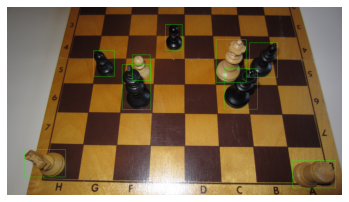

In [12]:
show_image_with_boxes(df_train)

In [13]:
df_train.to_csv('annotations.csv', index=False, header=None)

In [12]:
df_train.class_name.unique()

array(['black-pawn', 'white-pawn', 'black-bishop', 'black-rook',
       'black-knight', 'white-bishop', 'white-queen', 'black-king',
       'white-knight', 'white-king', 'black-queen', 'white-rook'],
      dtype=object)

In [14]:
classes = ['black-pawn', 'white-pawn', 'black-bishop', 'black-rook',
       'black-knight', 'white-bishop', 'white-queen', 'black-king',
       'white-knight', 'white-king', 'black-queen', 'white-rook']
with open('classes.csv', 'w') as f:
  for i, class_name in enumerate(classes):
    f.write(f'{class_name},{i}\n')

In [18]:
!head classes.csv

black-pawn,0
white-pawn,1
black-bishop,2
black-rook,3
black-knight,4
white-bishop,5
white-queen,6
black-king,7
white-knight,8
white-king,9


In [19]:
!head annotations.csv

/content/drive/My Drive/data/IMG_2043.JPG,591,1736,1087,2148,black-pawn
/content/drive/My Drive/data/IMG_2043.JPG,3181,1438,3673,1891,black-pawn
/content/drive/My Drive/data/IMG_2043.JPG,3018,596,3395,1058,black-pawn
/content/drive/My Drive/data/IMG_2043.JPG,3284,114,3658,568,white-pawn
/content/drive/My Drive/data/IMG_2043.JPG,1976,1058,2302,1510,white-pawn
/content/drive/My Drive/data/IMG_2043.JPG,1241,1627,1638,2053,white-pawn
/content/drive/My Drive/data/IMG_2043.JPG,2448,1333,2805,1786,white-pawn
/content/drive/My Drive/data/IMG_2043.JPG,1881,1583,2324,2129,black-bishop
/content/drive/My Drive/data/IMG_2043.JPG,1193,1014,1678,1580,black-rook
/content/drive/My Drive/data/IMG_2043.JPG,1314,397,1737,1022,black-knight


In [20]:
if not os.path.exists('snapshots'):
  os.mkdir('snapshots')

In [15]:
PRETRAINED_MODEL = 'snapshots/_pretrained_model.h5'

URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to snapshots/_pretrained_model.h5


In [16]:
%cd keras-retinanet/

/content/keras-retinanet


In [ ]:
!keras_retinanet/bin/train.py  --random-transform \
  --weights {PRETRAINED_MODEL} \
  --batch-size 4 \
  --steps 20 \
  --epochs 80 \
  csv annotations.csv classes.csv

2020-10-04 08:21:25.883582: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Creating model, this may take a second...
2020-10-04 08:21:27.518015: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-10-04 08:21:27.557547: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-10-04 08:21:27.558222: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-10-04 08:21:27.558269: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-10-04 08:21:27.560499: I t

In [48]:
!ls snapshots

_pretrained_model.h5  resnet50_csv_36.h5  resnet50_csv_61.h5
resnet50_csv_12.h5    resnet50_csv_37.h5  resnet50_csv_62.h5
resnet50_csv_13.h5    resnet50_csv_38.h5  resnet50_csv_63.h5
resnet50_csv_14.h5    resnet50_csv_39.h5  resnet50_csv_64.h5
resnet50_csv_15.h5    resnet50_csv_40.h5  resnet50_csv_65.h5
resnet50_csv_16.h5    resnet50_csv_41.h5  resnet50_csv_66.h5
resnet50_csv_17.h5    resnet50_csv_42.h5  resnet50_csv_67.h5
resnet50_csv_18.h5    resnet50_csv_43.h5  resnet50_csv_68.h5
resnet50_csv_19.h5    resnet50_csv_44.h5  resnet50_csv_69.h5
resnet50_csv_20.h5    resnet50_csv_45.h5  resnet50_csv_70.h5
resnet50_csv_21.h5    resnet50_csv_46.h5  resnet50_csv_71.h5
resnet50_csv_22.h5    resnet50_csv_47.h5  resnet50_csv_72.h5
resnet50_csv_23.h5    resnet50_csv_48.h5  resnet50_csv_73.h5
resnet50_csv_24.h5    resnet50_csv_49.h5  resnet50_csv_74.h5
resnet50_csv_25.h5    resnet50_csv_50.h5  resnet50_csv_75.h5
resnet50_csv_26.h5    resnet50_csv_51.h5  resnet50_csv_76.h5
resnet50_csv_27.h5    re

In [9]:
model = models.load_model("./snapshots/resnet50_csv_76.h5", backbone_name='resnet50')
model = models.convert_model(model)

label_map = {}
for line in open('classes.csv'):
  row = line.rstrip().split(',')
  label_map[int(row[1])] = row[0]

In [30]:
def show_image_with_predictions(df, threshold=0.6):

  row = df.sample()
  filepath = row['image_name'].values[0]
  print("filepath:", filepath)

  df2 = df[df['image_name'] == filepath]
  im = np.array(Image.open(filepath))
  print("im.shape:", im.shape)
  im = im[:,:,:3]
  for idx, row in df2.iterrows():
    box = [
      row['x_min'],
      row['y_min'],
      row['x_max'],
      row['y_max'],
    ]
    print(box)
    draw_box(im, box, color=(255, 0, 0))
  imp = preprocess_image(im)
  imp, scale = resize_image(im)
  boxes, scores, labels = model.predict_on_batch(
    np.expand_dims(imp, axis=0)
  )
  boxes /= scale
  for box, score, label in zip(boxes[0], scores[0], labels[0]):
    if score < threshold:
      break
    box = box.astype(np.int32)
    color = label_color(label)
    draw_box(im, box, color=color)
    class_name = label_map[label]
    caption = f"{class_name} {score:.3f}"
    font = cv2.FONT_HERSHEY_SIMPLEX 
    fontScale = 2
    color = (255, 0, 0) 
    thickness = 2 
    org = (box[0]-25,box[1]-25)
    im = cv2.putText(im, caption, org, font,  fontScale, color, thickness, cv2.LINE_AA) 
    #draw_caption(im, box, caption)

  plt.axis('off')
  plt.imshow(im)
  plt.show()

In [10]:
plt.rcParams['figure.figsize'] = [20, 10]

filepath: /content/drive/My Drive/data/IMG_2066.JPG
im.shape: (2248, 4000, 3)
[1233, 1465, 1808, 2098]
[814, 186, 1386, 958]
[2478, 171, 3003, 1057]
[3073, 1491, 3947, 2110]


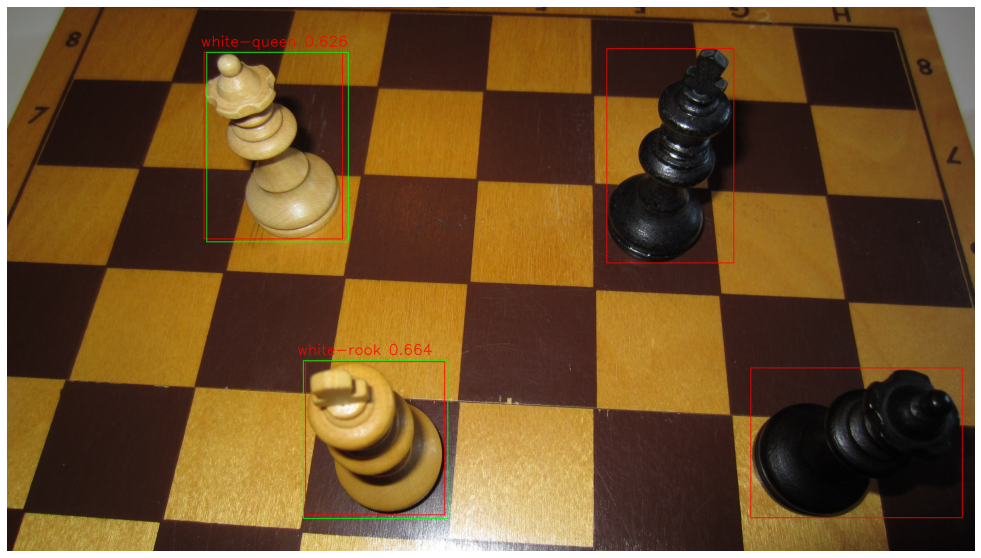

In [50]:
show_image_with_predictions(df_train, threshold=0.6)

filepath: /content/drive/My Drive/data/IMG_2024.JPG
im.shape: (2248, 4000, 3)
[1170, 1821, 1380, 1996]
[1408, 1836, 1587, 2009]
[1652, 1824, 1825, 1987]
[1844, 1840, 2034, 2045]
[2104, 1816, 2293, 2018]
[2382, 1802, 2545, 1962]
[2597, 1811, 2780, 2003]
[2871, 1821, 3087, 1998]
[2868, 1597, 3031, 1740]
[2590, 1585, 2736, 1723]
[2371, 1570, 2510, 1709]
[2146, 1571, 2275, 1702]
[1900, 1584, 2036, 1719]
[1670, 1585, 1806, 1718]
[1436, 1603, 1585, 1743]
[1201, 1598, 1352, 1732]
[1230, 502, 1386, 659]
[1459, 496, 1598, 656]
[1701, 464, 1832, 623]
[1897, 498, 2031, 656]
[2121, 496, 2251, 647]
[2354, 477, 2485, 634]
[2586, 446, 2716, 606]
[2788, 476, 2928, 631]
[2782, 177, 2960, 396]
[1209, 250, 1398, 465]
[1458, 230, 1628, 460]
[2557, 202, 2737, 421]
[2317, 204, 2464, 416]
[1675, 186, 1830, 407]
[1903, 153, 2069, 424]
[2113, 142, 2282, 432]


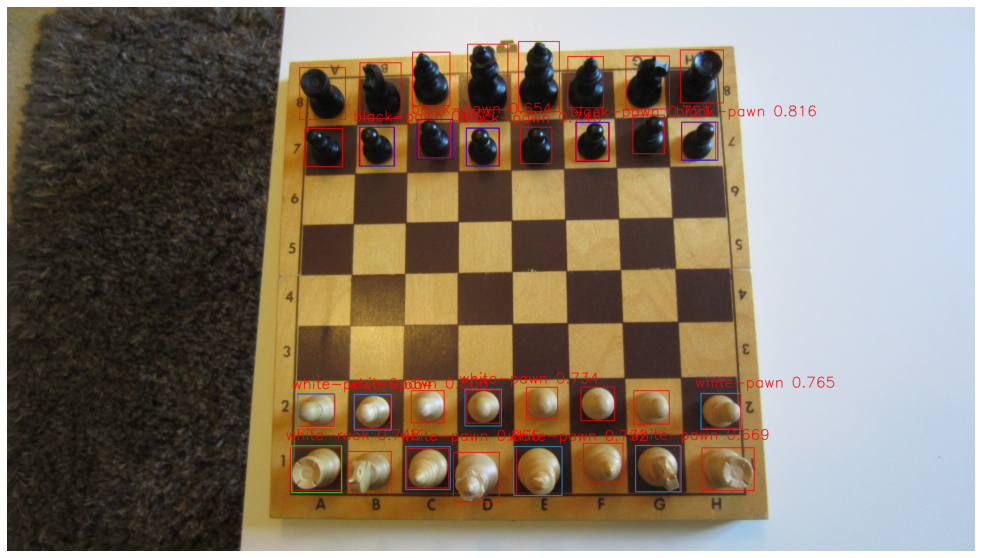

In [39]:
show_image_with_predictions(df_train, threshold=0.6)

filepath: /content/drive/My Drive/data/IMG_2044.JPG
im.shape: (2248, 4000, 3)
[2129, 1, 2480, 826]
[1701, 593, 2044, 1211]
[1149, 475, 1452, 896]
[675, 967, 1062, 1396]
[529, 1790, 1001, 2221]
[1631, 1313, 1949, 1744]


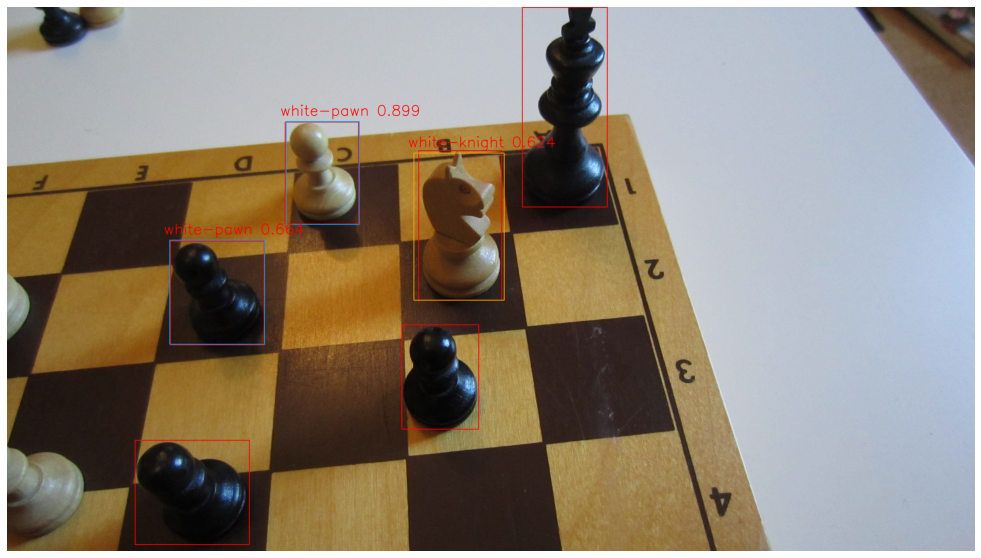

In [40]:
show_image_with_predictions(df_train, threshold=0.6)

filepath: /content/drive/My Drive/data/IMG_2054.JPG
im.shape: (2248, 4000, 3)
[792, 123, 1376, 803]
[990, 1450, 1704, 2050]
[2151, 315, 2506, 864]
[2627, 862, 3288, 1603]
[3321, 1107, 3940, 1628]


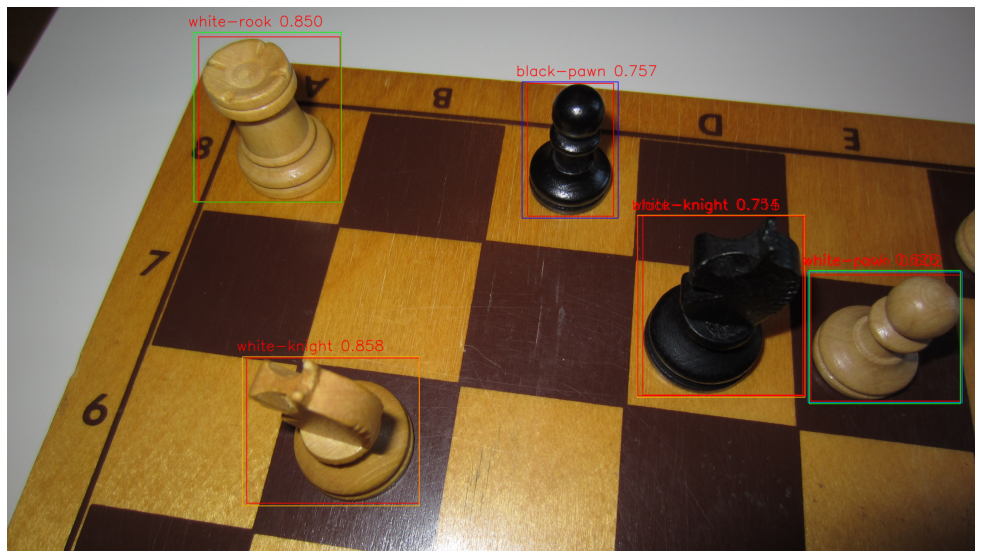

In [51]:
show_image_with_predictions(df_train, threshold=0.6)

filepath: /content/drive/My Drive/data/IMG_2026.JPG
im.shape: (2248, 4000, 3)
[568, 1107, 908, 1348]
[1020, 1116, 1317, 1360]
[1456, 1068, 1712, 1316]
[1874, 1073, 2118, 1313]
[2297, 1047, 2549, 1290]
[2703, 1052, 2991, 1292]
[3093, 1078, 3428, 1324]
[3567, 1107, 3975, 1342]
[3575, 1486, 4000, 1783]
[510, 1494, 943, 1799]
[921, 1521, 1316, 1821]
[3109, 1481, 3564, 1797]
[2706, 1451, 3078, 1746]
[1421, 1505, 1735, 1791]
[1786, 1529, 2118, 1885]
[2247, 1485, 2616, 1833]


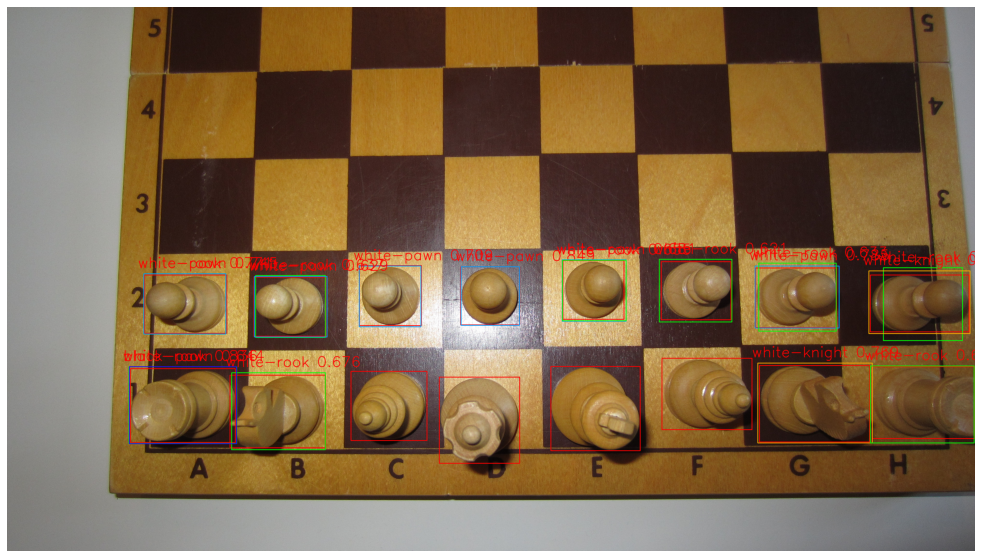

In [42]:
show_image_with_predictions(df_train, threshold=0.6)

filepath: /content/drive/My Drive/data/IMG_2069.JPG
im.shape: (2248, 4000, 3)
[954, 1336, 1351, 1653]
[1412, 380, 1762, 859]
[1456, 879, 1760, 1234]
[1325, 1799, 1636, 2099]
[1846, 1287, 2157, 1676]
[2253, 1769, 2583, 2064]
[2994, 1227, 3523, 1619]
[2596, 926, 2930, 1284]
[2572, 356, 2953, 903]
[3006, 154, 3351, 573]


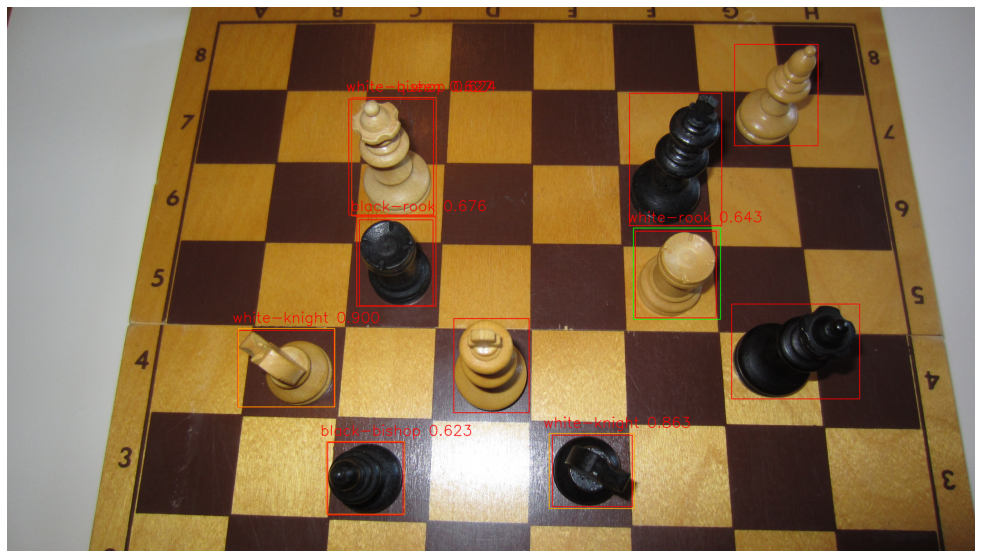

In [43]:
show_image_with_predictions(df_train, threshold=0.6)

filepath: /content/drive/My Drive/data/IMG_2024.JPG
im.shape: (2248, 4000, 3)
[1170, 1821, 1380, 1996]
[1408, 1836, 1587, 2009]
[1652, 1824, 1825, 1987]
[1844, 1840, 2034, 2045]
[2104, 1816, 2293, 2018]
[2382, 1802, 2545, 1962]
[2597, 1811, 2780, 2003]
[2871, 1821, 3087, 1998]
[2868, 1597, 3031, 1740]
[2590, 1585, 2736, 1723]
[2371, 1570, 2510, 1709]
[2146, 1571, 2275, 1702]
[1900, 1584, 2036, 1719]
[1670, 1585, 1806, 1718]
[1436, 1603, 1585, 1743]
[1201, 1598, 1352, 1732]
[1230, 502, 1386, 659]
[1459, 496, 1598, 656]
[1701, 464, 1832, 623]
[1897, 498, 2031, 656]
[2121, 496, 2251, 647]
[2354, 477, 2485, 634]
[2586, 446, 2716, 606]
[2788, 476, 2928, 631]
[2782, 177, 2960, 396]
[1209, 250, 1398, 465]
[1458, 230, 1628, 460]
[2557, 202, 2737, 421]
[2317, 204, 2464, 416]
[1675, 186, 1830, 407]
[1903, 153, 2069, 424]
[2113, 142, 2282, 432]


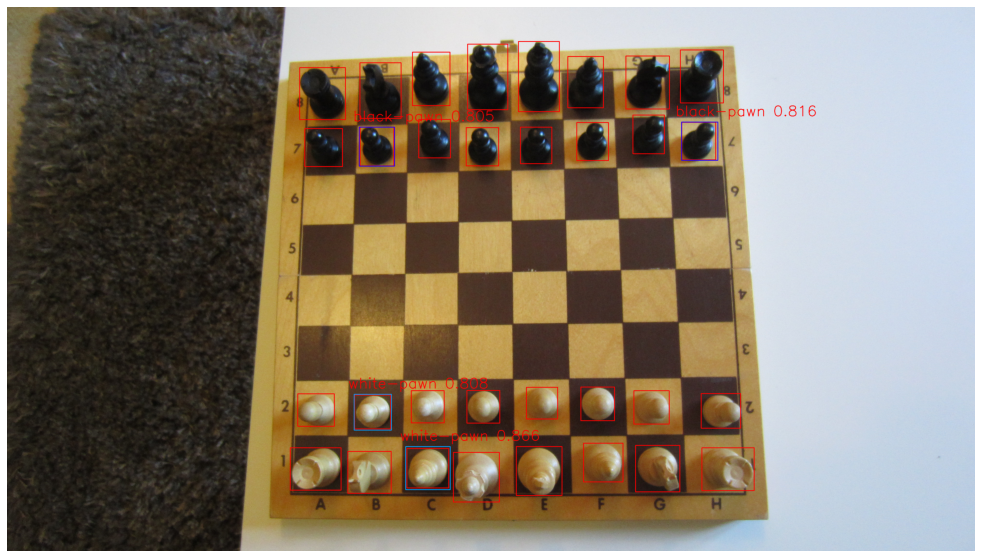

In [45]:
show_image_with_predictions(df_train, threshold=0.8)

filepath: /content/drive/My Drive/data/IMG_2028.JPG
im.shape: (2248, 4000, 3)
[1622, 1723, 1871, 1985]
[2499, 1269, 2769, 1515]
[3201, 458, 3518, 767]
[898, 480, 1184, 771]
[1065, 720, 1507, 1158]
[2029, 1123, 2365, 1509]
[1555, 678, 1899, 1125]


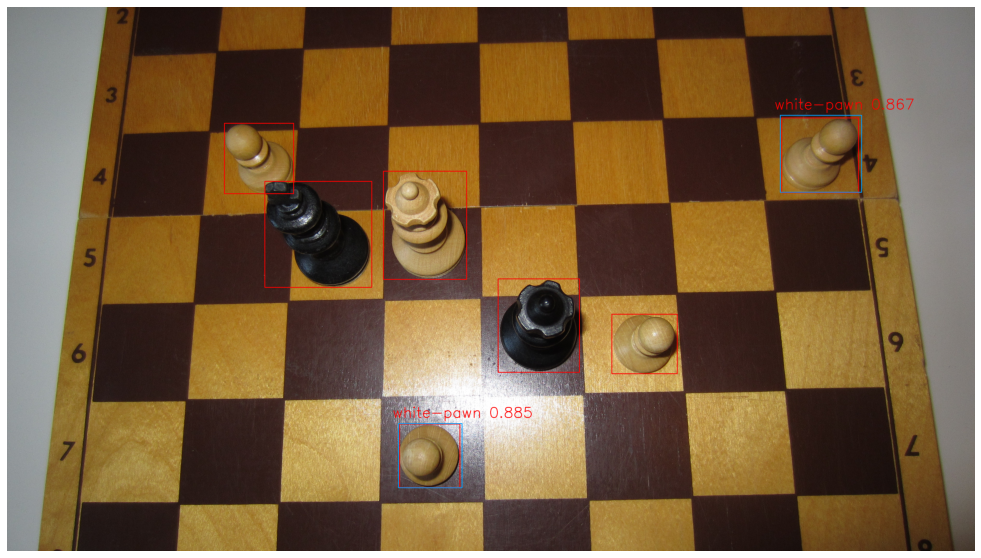

In [44]:
show_image_with_predictions(df_train, threshold=0.8)

filepath: /content/drive/My Drive/data/IMG_2025.JPG
im.shape: (2248, 4000, 3)
[508, 1316, 831, 1543]
[930, 1313, 1221, 1547]
[1410, 1261, 1645, 1494]
[1778, 1333, 2008, 1563]
[2176, 1332, 2410, 1564]
[2590, 1301, 2849, 1533]
[3000, 1253, 3306, 1492]
[3351, 1306, 3700, 1534]
[3324, 751, 3730, 1093]
[478, 843, 891, 1185]
[947, 817, 1297, 1171]
[2934, 811, 3343, 1141]
[2516, 818, 2813, 1157]
[1354, 760, 1651, 1092]
[1776, 708, 2076, 1130]
[2160, 724, 2463, 1152]


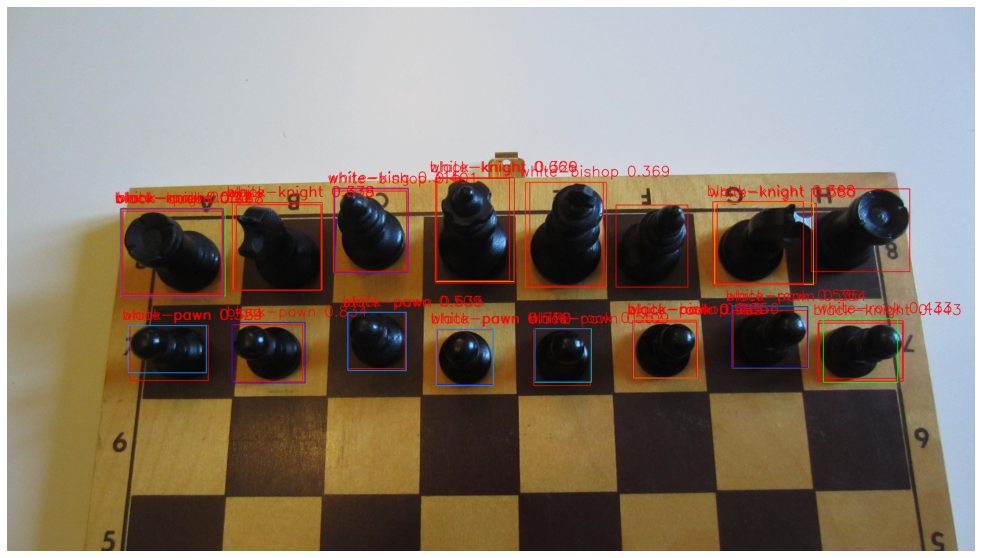

In [55]:
show_image_with_predictions(df_train, threshold=0.3)

filepath: /content/drive/My Drive/data/IMG_2008.JPG
im.shape: (2248, 4000, 3)
[2208, 678, 2685, 1186]


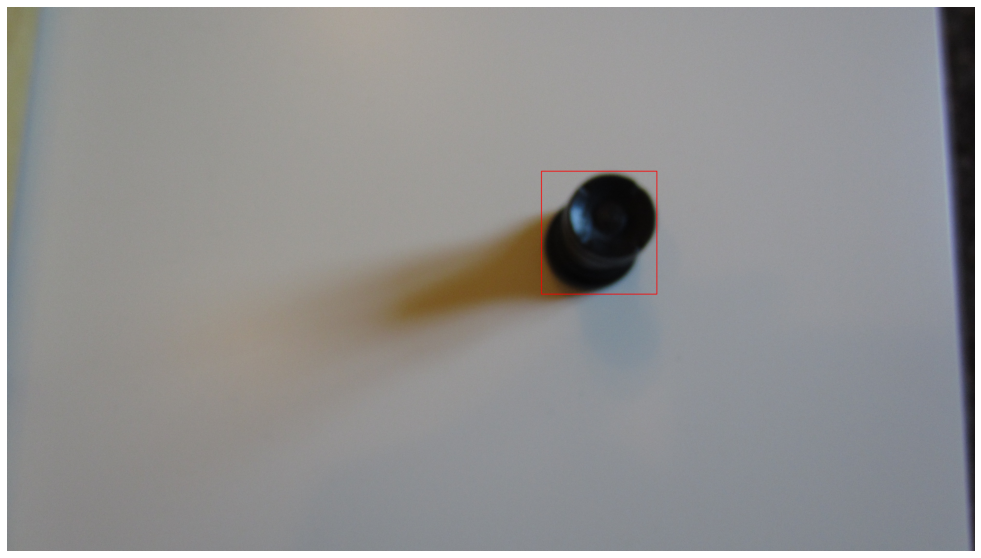

In [53]:
show_image_with_predictions(df_train, threshold=0.6)